In [18]:
import logging
import os

from google import genai
from pydantic_settings import BaseSettings


class GeminiConnectionError(ConnectionError):
    """Custom exception for Gemini client connection errors."""


class Settings(BaseSettings):
    GEMINI_API_KEY: str
    GCP_CREDENTIALS: str
    GCP_PROJECT: str
    GCP_REGION: str
    TIMESCALE_SERVICE_URL: str

    LANGSMITH_API_KEY: str = ""
    LANGSMITH_TRACING_V2: str = "true"
    LANGSMITH_ENDPOINT: str = "https://api.smith.langchain.com"
    LANGSMITH_PROJECT: str = ""

    UNSTRUCTURED_API: str = ""


settings = Settings(_env_file=".env", _env_file_encoding="utf-8")

os.environ["GOOGLE_API_KEY"] = settings.GEMINI_API_KEY
os.environ["GOOGLE_APPLICATION_CREDENTIALS"] = settings.GCP_CREDENTIALS
os.environ["GOOGLE_CLOUD_PROJECT"] = settings.GCP_PROJECT
os.environ["GOOGLE_CLOUD_REGION"] = settings.GCP_REGION

if settings.LANGSMITH_API_KEY != "" and settings.LANGSMITH_PROJECT != "":
    os.environ["LANGSMITH_API_KEY"] = settings.LANGSMITH_API_KEY
    os.environ["LANGSMITH_TRACING"] = settings.LANGSMITH_TRACING_V2
    os.environ["LANGSMITH_ENDPOINT"] = settings.LANGSMITH_ENDPOINT
    os.environ["LANGSMITH_PROJECT"] = settings.LANGSMITH_PROJECT

try:
    logging.info("Initializing Gemini client...")
    CLIENT_GEMINI = genai.Client()
except Exception as e:
    raise GeminiConnectionError(f"Error initializing Gemini client: {e}")

logging.basicConfig(
    level=logging.INFO,
    format="%(asctime)s - %(levelname)s - %(message)s",
)

GEMINI_MODEL = "gemini-2.5-flash"
EMBEDDING_MODEL = "gemini-embedding-001"
TEMPERATURE = 0.1
MAX_OUTPUT_TOKENS = 2048
CHUNK_SIZE = 4000
COMBINE_TEXT_UNDER_N_CHARS = 1500
NEW_AFTER_N_CHARACTERS = 3000
LANGUAGES = ["eng", "pt"]
MAX_RETRIES = 3


2025-11-15 12:07:11,572 - INFO - Initializing Gemini client...


In [19]:
import json
import logging
import os
from datetime import datetime
import pandas as pd
from langchain_community.vectorstores import FAISS
from timescale_vector.client import uuid_from_time
from unstructured.documents.elements import CompositeElement, Image, Table
from unstructured.partition.pdf import partition_pdf
import re
from langchain_core.messages import HumanMessage
from prompts import PROMPT_IMAGE, PROMPT_TEXT
from schemas import RESPONSE_SCHEMA
from langchain.prompts import PromptTemplate
from langchain_core.messages import HumanMessage
from langchain_google_genai import GoogleGenerativeAIEmbeddings
from langchain_google_vertexai import ChatVertexAI, VertexAI
import config


2025-11-15 12:07:18,938 - INFO - Initializing Gemini client...


In [3]:
def separate_data(chunks):
            tables_data = []
            texts_data = []
            images_data = []

            for chunk in chunks:
                if isinstance(chunk, Table):
                    tables_data.append(
                        {
                            "id": str(uuid_from_time(datetime.now())),
                            "metadata": json.dumps(chunk.metadata.to_dict()),
                            "contents": chunk.text,
                        }
                    )

                elif isinstance(chunk, CompositeElement):
                    texts_data.append(
                        {
                            "id": str(uuid_from_time(datetime.now())),
                            "contents": chunk.text,
                            "metadata": json.dumps(chunk.metadata.to_dict()),
                        }
                    )
                    if hasattr(chunk.metadata, "orig_elements"):
                        for element in chunk.metadata.orig_elements:
                            if isinstance(element, Image):
                                images_data.append(
                                    {
                                        "id": str(uuid_from_time(datetime.now())),
                                        "contents": element.metadata.image_base64,
                                        "metadata": json.dumps(chunk.metadata.to_dict()),
                                    }
                                )

                elif isinstance(chunk, Image):
                    images_data.append(
                        {
                            "id": str(uuid_from_time(datetime.now())),
                            "metadata": json.dumps(chunk.metadata.to_dict()),
                            "contents": chunk.metadata.image_base64,
                        }
                    )

            logging.info(
                f"Separated {len(tables_data)} tables, {len(texts_data)} texts, and {len(images_data)} images."
            )

            tables_df = pd.DataFrame(tables_data)
            texts_df = pd.DataFrame(texts_data)
            images_df = pd.DataFrame(images_data)

            return tables_df, texts_df, images_df

In [4]:
def _pdf_chunking_process(pdf_path):
        return partition_pdf(
            filename=pdf_path,
            infer_table_structure=True,
            strategy="hi_res",
            languages=["eng", "por"],
            extract_image_block_types=["Image", "Table"],
            extract_image_block_to_payload=True,
            chunking_strategy="by_title",
            max_characters=10000,
            combine_text_under_n_chars=1500,
            new_after_n_characters=9000,
        )

In [5]:
prompt = PromptTemplate.from_template(PROMPT_TEXT)

summarize_chain_text = prompt | VertexAI(
    model_name="gemini-2.5-flash",
    temperature=0.1,
    max_output_tokens=2048,
    response_schema=RESPONSE_SCHEMA,
    response_mime_type="application/json",
    max_retries=3,
)

summarize_chain_image = ChatVertexAI(
    model="gemini-2.5-flash",
    temperature=0.1,
    max_output_tokens=2048,
    response_schema=RESPONSE_SCHEMA,
    response_mime_type="application/json",
    max_retries=3,
)
def test_json_validity(response: str) -> bool:
    try:
        json.loads(response)
        return response
    except json.JSONDecodeError as e:
        logging.info(f"JSON decode error: {e}. Retrying...")
        return None

def _generate_text_summaries(content):
        def clean_text(text):
            if text and len(text.split()) > 3:
                return re.sub(r"\u2022", "", text).strip()
            return None

        content = clean_text(content)
        if not content or content == "":
            return None
        logging.info(f"Generating summary for text {content[0:10]}...")
        response = summarize_chain_text.invoke({"element": content})
        return test_json_validity(response)
        

def _genenate_image_summaries(content):
    image_message = {
        "type": "image_url",
        "image_url": {"url": f"data:image/jpeg;base64,{content}"},
    }
    text_message = {
        "type": "text",
        "text": PROMPT_IMAGE,
    }
    message = HumanMessage(content=[image_message, text_message])
    response = summarize_chain_image.invoke([message])
    if not response.content or response.content.strip() == "":
        return None
    return test_json_validity(response.content)


In [6]:
def update_metadata_and_summary(df):
    flat = (
        pd.json_normalize(df["summarized_content"])
        .reset_index(drop=True)
    )
    df = df.reset_index(drop=True)
    df = df.join(flat)
    # Garante que metadata seja JSON válido antes de salvar
    df["metadata"] = df.apply(
        lambda r: json.dumps({**json.loads(r["metadata"]), "isReference": r["isReference"]}),
        axis=1
    )
    return df.drop(columns=["isReference"])


def process_df(df, content="text"):
    df["summarized_content"] = df["contents"].apply(
        _generate_text_summaries if content == "text" else _genenate_image_summaries
    )
    df = df.dropna(subset=["summarized_content"])
    df["summarized_content"] = df["summarized_content"].apply(
        lambda x: json.loads(x)[0]
    )
    return update_metadata_and_summary(df)

In [20]:
pdf_paths = ["/mnt/vini/VirBotAI/tests/teste3.pdf"]
pdf_list = []
cache_df = pd.DataFrame()

for pdf_path in pdf_paths:
    if pdf_path in pdf_list:
        continue
    chunks = _pdf_chunking_process(pdf_path)
   

2025-11-09 19:53:15,546 - INFO - Reading PDF for file: /mnt/vini/VirBotAI/tests/teste3.pdf ...


In [8]:
cache = "/mnt/vini/VirBotAI/cache.csv"

def save_cache(df, cache_path):
    df.to_csv(cache_path, index=False)

In [9]:
PROCESSED_DFS = {
    "text": [],
    "table": [],
    "image": [],
}

logging.info(f"Chunked {pdf_path} into {len(chunks)} chunks.")
tables_df, texts_df, images_df = separate_data(chunks)

print(f"tables_df: {tables_df.shape}, texts_df: {texts_df.shape}, images_df: {images_df.shape}")
for name, df in [
    ("text", texts_df),
    ("table", tables_df),
    ("image", images_df),
]:
    if df.empty:
        continue

    df = process_df(df, content="image") if name == "image" else process_df(df)
    PROCESSED_DFS[name].append(df)

texts_all_df = pd.concat(PROCESSED_DFS["text"], ignore_index=True) if PROCESSED_DFS["text"] else None
tables_all_df = pd.concat(PROCESSED_DFS["table"], ignore_index=True) if PROCESSED_DFS["table"] else None
images_all_df = pd.concat(PROCESSED_DFS["image"], ignore_index=True) if PROCESSED_DFS["image"] else None

merged_df = pd.concat(
[d for d in [texts_all_df, tables_all_df, images_all_df] if d is not None],
ignore_index=True,
)

if not cache_df.empty:
    merged_df = pd.concat([cache_df, merged_df], ignore_index=True)

save_cache(merged_df, cache)

display(merged_df)

2025-11-09 17:34:58,147 - INFO - Chunked /mnt/vini/VirBotAI/PDFs/teste2.pdf into 7 chunks.
2025-11-09 17:34:58,583 - INFO - Separated 0 tables, 7 texts, and 8 images.
2025-11-09 17:34:58,585 - INFO - Generating summary for text Journal of...


tables_df: (0, 0), texts_df: (7, 3), images_df: (8, 3)


2025-11-09 17:35:02,641 - INFO - Generating summary for text https://do...
2025-11-09 17:35:10,219 - INFO - Generating summary for text The qualit...
2025-11-09 17:35:15,237 - INFO - Generating summary for text Table 1

C...
2025-11-09 17:35:24,350 - INFO - JSON decode error: Unterminated string starting at: line 15 column 16 (char 1870). Retrying...
2025-11-09 17:35:24,354 - INFO - Generating summary for text Additional...
2025-11-09 17:35:31,353 - INFO - Generating summary for text Journal of...
2025-11-09 17:35:39,506 - INFO - JSON decode error: Unterminated string starting at: line 7 column 16 (char 234). Retrying...
2025-11-09 17:35:39,509 - INFO - Generating summary for text JJ.C. de V...
/tmp/ipykernel_20427/3239281724.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

,id,contents,metadata,summarized_content,summary
0,8ecf3246-bdab-11f0-bad2-8e6d3687289b,Journal of Clinical Virology 141 (2021) 104908...,"{""filetype"": ""application/pdf"", ""languages"": [...",{'summary': 'The European Society for Clinical...,The European Society for Clinical Virology (ES...
1,8ed7b45c-bdab-11f0-bbce-e85e7f8f683b,https://doi.org/10.1016/j.jev.2021.104908\n\nh...,"{""filetype"": ""application/pdf"", ""languages"": [...",{'summary': 'This study benchmarked 13 viral m...,This study benchmarked 13 viral metagenomic pi...
2,8ed94d30-bdab-11f0-99a6-d2410b324fcc,The qualitative and quantitative results of th...,"{""filetype"": ""application/pdf"", ""languages"": [...",{'summary': 'Benchmarking of 13 metagenomic pi...,Benchmarking of 13 metagenomic pipelines (e.g....
3,8f0d9658-bdab-11f0-9753-00aa3698da60,"Additional viruses, either not tested for by R...","{""filetype"": ""application/pdf"", ""languages"": [...",{'summary': 'A large-scale international bench...,A large-scale international benchmarking study...
4,8f10f762-bdab-11f0-8fc5-90390ea2f074,JJ.C. de Vries et al.\n\nJournal of Clinical V...,"{""filetype"": ""application/pdf"", ""languages"": [...",{'summary': 'This content consists of a list o...,This content consists of a list of scientific ...
5,8ed1e658-bdab-11f0-a72f-cd6911b11006,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"{""filetype"": ""application/pdf"", ""languages"": [...",{'summary': 'This image displays a stylized em...,"This image displays a stylized emblem, commonl..."
6,8ed3e714-bdab-11f0-955b-0f3e13487db6,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"{""filetype"": ""application/pdf"", ""languages"": [...",{'summary': 'The image displays the cover of a...,The image displays the cover of a scientific j...
7,8ed5dc72-bdab-11f0-a60b-6839ca38c21b,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"{""filetype"": ""application/pdf"", ""languages"": [...",{'summary': 'The provided image is not a scien...,The provided image is not a scientific figure ...
8,8edaa392-bdab-11f0-8437-75199c02fd69,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"{""filetype"": ""application/pdf"", ""languages"": [...",{'summary': 'This figure illustrates a bioinfo...,This figure illustrates a bioinformatics workf...
9,8ee5cd76-bdab-11f0-939a-faa96ff07526,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"{""filetype"": ""application/pdf"", ""languages"": [...",{'summary': 'The figure presents a heatmap eva...,The figure presents a heatmap evaluating the p...


In [12]:
vectorstore_path = "/mnt/vini/VirBotAI/vectorstore"
embeddings = GoogleGenerativeAIEmbeddings(model="gemini-embedding-001")

def _create_faiss_vectorstore(df):
    texts = df["summary"].tolist()
    metadatas = [
            json.loads(m) if isinstance(m, str) else m 
            for m in df["metadata"]
        ]
    ids = df["id"].tolist()

    vectorstore = FAISS.from_texts(
        texts,
        embeddings,
        metadatas=metadatas,
        ids=ids,
    )

    vectorstore.save_local(vectorstore_path)
    return vectorstore

display(merged_df)
vectorstore = _create_faiss_vectorstore(merged_df)

,id,contents,metadata,summarized_content,summary
0,8ecf3246-bdab-11f0-bad2-8e6d3687289b,Journal of Clinical Virology 141 (2021) 104908...,"{""filetype"": ""application/pdf"", ""languages"": [...",{'summary': 'The European Society for Clinical...,The European Society for Clinical Virology (ES...
1,8ed7b45c-bdab-11f0-bbce-e85e7f8f683b,https://doi.org/10.1016/j.jev.2021.104908\n\nh...,"{""filetype"": ""application/pdf"", ""languages"": [...",{'summary': 'This study benchmarked 13 viral m...,This study benchmarked 13 viral metagenomic pi...
2,8ed94d30-bdab-11f0-99a6-d2410b324fcc,The qualitative and quantitative results of th...,"{""filetype"": ""application/pdf"", ""languages"": [...",{'summary': 'Benchmarking of 13 metagenomic pi...,Benchmarking of 13 metagenomic pipelines (e.g....
3,8f0d9658-bdab-11f0-9753-00aa3698da60,"Additional viruses, either not tested for by R...","{""filetype"": ""application/pdf"", ""languages"": [...",{'summary': 'A large-scale international bench...,A large-scale international benchmarking study...
4,8f10f762-bdab-11f0-8fc5-90390ea2f074,JJ.C. de Vries et al.\n\nJournal of Clinical V...,"{""filetype"": ""application/pdf"", ""languages"": [...",{'summary': 'This content consists of a list o...,This content consists of a list of scientific ...
5,8ed1e658-bdab-11f0-a72f-cd6911b11006,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"{""filetype"": ""application/pdf"", ""languages"": [...",{'summary': 'This image displays a stylized em...,"This image displays a stylized emblem, commonl..."
6,8ed3e714-bdab-11f0-955b-0f3e13487db6,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"{""filetype"": ""application/pdf"", ""languages"": [...",{'summary': 'The image displays the cover of a...,The image displays the cover of a scientific j...
7,8ed5dc72-bdab-11f0-a60b-6839ca38c21b,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"{""filetype"": ""application/pdf"", ""languages"": [...",{'summary': 'The provided image is not a scien...,The provided image is not a scientific figure ...
8,8edaa392-bdab-11f0-8437-75199c02fd69,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"{""filetype"": ""application/pdf"", ""languages"": [...",{'summary': 'This figure illustrates a bioinfo...,This figure illustrates a bioinformatics workf...
9,8ee5cd76-bdab-11f0-939a-faa96ff07526,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"{""filetype"": ""application/pdf"", ""languages"": [...",{'summary': 'The figure presents a heatmap eva...,The figure presents a heatmap evaluating the p...


In [13]:
texts = merged_df["summary"].tolist()
metadatas = [
        json.loads(m) if isinstance(m, str) else m 
        for m in merged_df["metadata"]
    ]
ids = merged_df["id"].tolist()

vectorstore = vectorstore.from_texts(
    texts,
    embeddings,
    metadatas=metadatas,
    ids=ids,
)

display(vectorstore)

In [ ]:
vectorstore.from_texts(
        texts,
        embeddings,
        metadatas=metadatas,
        ids=ids,
    )

In [32]:
def _load_faiss_vectorstore(vectorstore_path, embeddings):
    return FAISS.load_local(
        vectorstore_path,
        embeddings,
        allow_dangerous_deserialization=True,
    )

_load_faiss_vectorstore(vectorstore_path, embeddings)

In [3]:
import pandas as pd
import json

def _load_cache(cache):
    cache_df = pd.read_csv(cache)
    display(cache_df)
    cache_df["metadata"] = cache_df["metadata"].apply(json.loads)

    pdf_list.extend([
        os.path.join(
            row["metadata"].get("file_directory", ""),
            row["metadata"].get("filename", "")
        )
        for _, row in cache_df.iterrows()
        if "metadata" in row and row["metadata"]
    ])

_load_cache(cache = "/mnt/vini/VirBotAI/cache.csv")

,id,contents,metadata,summarized_content,summary
0,635f451a-bb7b-11f0-92bf-f41a7523d31b,Journal of Clinical Virology 141 (2021) 104908...,"{'filetype': 'application/pdf', 'languages': [...",{'summary': 'This study benchmarks 13 bioinfor...,This study benchmarks 13 bioinformatic pipelin...
1,6368b410-bb7b-11f0-8fba-60c2a86c1822,https://doi.org/10.1016/j.jev.2021.104908\n\nh...,"{'filetype': 'application/pdf', 'languages': [...",{'summary': 'A benchmarking study compared 13 ...,A benchmarking study compared 13 viral metagen...
2,636b029c-bb7b-11f0-a932-248e51887d1e,The qualitative and quantitative results of th...,"{'filetype': 'application/pdf', 'languages': [...",{'summary': 'Benchmarking of metagenomic pipel...,Benchmarking of metagenomic pipelines for viru...
3,636f212e-bb7b-11f0-b6c7-a8c85a3e7b26,"Table 1\n\nClinical use, classification and ou...","{'filetype': 'application/pdf', 'languages': [...","{'summary': ""Table 1 details the clinical use,...","Table 1 details the clinical use, classificati..."
4,63b03132-bb7b-11f0-80d9-c2451dab21d2,"Additional viruses, either not tested for by R...","{'filetype': 'application/pdf', 'languages': [...",{'summary': 'This study benchmarked bioinforma...,This study benchmarked bioinformatic tools and...
5,6361c65a-bb7b-11f0-8346-942afcbd81a3,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"{'filetype': 'application/pdf', 'languages': [...","{'summary': ""The provided image is identified ...",The provided image is identified as the corpor...
6,63640e38-bb7b-11f0-855c-75ee0f51d780,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"{'filetype': 'application/pdf', 'languages': [...",{'summary': 'The image displays the cover of a...,The image displays the cover of a scientific j...
7,6366649e-bb7b-11f0-a433-3798c1e6babf,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"{'filetype': 'application/pdf', 'languages': [...",{'summary': 'The image displays a graphical us...,The image displays a graphical user interface ...
8,636d2b1c-bb7b-11f0-9daf-bab35397a378,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"{'filetype': 'application/pdf', 'languages': [...",{'summary': 'This figure presents a bioinforma...,This figure presents a bioinformatics workflow...
9,637df906-bb7b-11f0-9f3f-0dbabeee45f0,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"{'filetype': 'application/pdf', 'languages': [...",{'summary': 'The figure displays a heatmap eva...,The figure displays a heatmap evaluating the p...


JSONDecodeError: Expecting property name enclosed in double quotes: line 1 column 2 (char 1)

In [13]:
from docling.chunking import HybridChunker
from langchain_docling import DoclingLoader
from langchain_docling.loader import ExportType

FILE_PATH = "/mnt/vini/VirBotAI/tests/teste2.pdf"

loader_lang = DoclingLoader(
    file_path=FILE_PATH,
    export_type=ExportType.MARKDOWN
)

In [14]:
docs_lang = loader_lang.load()

2025-11-10 21:09:54,444 - INFO - detected formats: [<InputFormat.PDF: 'pdf'>]
2025-11-10 21:09:54,452 - INFO - Going to convert document batch...
2025-11-10 21:09:54,453 - INFO - Initializing pipeline for StandardPdfPipeline with options hash f9730ffaa6e7f8d4fb0c98c8df3f18cb
2025-11-10 21:09:54,454 - INFO - Accelerator device: 'cpu'
[INFO] 2025-11-10 21:09:54,497 [RapidOCR] base.py:22: Using engine_name: onnxruntime
[INFO] 2025-11-10 21:09:54,516 [RapidOCR] download_file.py:60: File exists and is valid: /home/vini8cs/Repositores/Vir_ChatBot/.venv/lib/python3.12/site-packages/rapidocr/models/ch_PP-OCRv4_det_infer.onnx
[INFO] 2025-11-10 21:09:54,517 [RapidOCR] main.py:53: Using /home/vini8cs/Repositores/Vir_ChatBot/.venv/lib/python3.12/site-packages/rapidocr/models/ch_PP-OCRv4_det_infer.onnx
[INFO] 2025-11-10 21:09:54,619 [RapidOCR] base.py:22: Using engine_name: onnxruntime
[INFO] 2025-11-10 21:09:54,622 [RapidOCR] download_file.py:60: File exists and is valid: /home/vini8cs/Repositores

In [15]:
for table in docs_lang.tables:
    print(table)

AttributeError: 'list' object has no attribute 'tables'

In [16]:
EMBED_MODEL_ID = "sentence-transformers/all-MiniLM-L6-v2"


loader = DoclingLoader(
    file_path=FILE_PATH,
    export_type=ExportType.DOC_CHUNKS,
    chunker=HybridChunker(tokenizer=EMBED_MODEL_ID),
)

In [26]:
docs_lang = loader.load()

2025-11-10 21:18:47,806 - INFO - detected formats: [<InputFormat.PDF: 'pdf'>]
2025-11-10 21:18:47,813 - INFO - Going to convert document batch...
2025-11-10 21:18:47,814 - INFO - Initializing pipeline for StandardPdfPipeline with options hash f9730ffaa6e7f8d4fb0c98c8df3f18cb
2025-11-10 21:18:47,815 - INFO - Accelerator device: 'cpu'
[INFO] 2025-11-10 21:18:47,847 [RapidOCR] base.py:22: Using engine_name: onnxruntime
[INFO] 2025-11-10 21:18:47,864 [RapidOCR] download_file.py:60: File exists and is valid: /home/vini8cs/Repositores/Vir_ChatBot/.venv/lib/python3.12/site-packages/rapidocr/models/ch_PP-OCRv4_det_infer.onnx
[INFO] 2025-11-10 21:18:47,865 [RapidOCR] main.py:53: Using /home/vini8cs/Repositores/Vir_ChatBot/.venv/lib/python3.12/site-packages/rapidocr/models/ch_PP-OCRv4_det_infer.onnx
[INFO] 2025-11-10 21:18:47,971 [RapidOCR] base.py:22: Using engine_name: onnxruntime
[INFO] 2025-11-10 21:18:47,974 [RapidOCR] download_file.py:60: File exists and is valid: /home/vini8cs/Repositores

In [27]:
import json
from uuid import uuid4
from datetime import datetime

info = []

for doc in docs_lang:
    doc_items = doc.metadata["dl_meta"].get("doc_items", [])

    # collect page numbers
    pages = sorted(
        { item["prov"][0]["page_no"] for item in doc_items if item.get("prov") }
    )

    # choose a representative type for the chunk:
    # many chunks have exactly 1 doc_item
    if len(doc_items) == 1:
        doc_item_type = doc_items[0].get("label", "")
    else:
        # fallback for multi-item chunks
        types = { item.get("label","") for item in doc_items }
        doc_item_type = ",".join(sorted(types))

    info.append(
        {
            "metadata": json.dumps(
                {
                    "pages": pages,
                    "source": doc.metadata["source"],
                    "headings": doc.metadata.get("headings", ""),
                    "doc_item_type": doc_item_type
                }
            ),
            "content": doc.page_content,
            "id": str(uuid4())
        }
    )


In [28]:
import pandas as pd
info_df = pd.DataFrame(info)

display(info_df)

,metadata,content,id
0,"{""pages"": [1], ""source"": ""/mnt/vini/VirBotAI/t...","GLYPH<c=11,font=/XNFOPO+TimesNewRomanPS-Italic...",33f8bd63-2de8-4e55-9298-0bf729a8aa4f
1,"{""pages"": [1], ""source"": ""/mnt/vini/VirBotAI/t...",Journal of Clinical Virology\njournal homepage...,2bfe9b4b-6993-4fca-9b20-f1a0bbc80454
2,"{""pages"": [1], ""source"": ""/mnt/vini/VirBotAI/t...",Benchmark of thirteen bioinformatic pipelines ...,0fe86a8d-a3b7-4964-b073-c201b2aaca1e
3,"{""pages"": [1], ""source"": ""/mnt/vini/VirBotAI/t...",Benchmark of thirteen bioinformatic pipelines ...,88e800f8-3d38-4296-a529-60855cf5441b
4,"{""pages"": [1], ""source"": ""/mnt/vini/VirBotAI/t...",Benchmark of thirteen bioinformatic pipelines ...,02ea7440-51e3-4e0b-a4b1-a3ba8ba41a0d
...,...,...,...
67,"{""pages"": [8], ""source"": ""/mnt/vini/VirBotAI/t...","References\n- [37] M. Scheuch, D. Hoper, M. Be...",cafe7520-4ffe-43a2-aa6c-253037ae6acb
68,"{""pages"": [8, 9], ""source"": ""/mnt/vini/VirBotA...","References\n- [42] D.A. Benson, et al., GenBan...",be3d7aef-3e37-4cb3-9595-5f05dd7476d8
69,"{""pages"": [9], ""source"": ""/mnt/vini/VirBotAI/t...","References\n- [47] A.M. Bolger, M. Lohse, B. U...",96d222f9-5e14-4f2a-ac4f-01ba0a956136
70,"{""pages"": [9], ""source"": ""/mnt/vini/VirBotAI/t...","References\n- [51] J. Kawada, et al., Identifi...",30867791-70f8-489c-85a1-14e595b334e4


In [29]:
import json

types = (
    info_df["metadata"]
    .apply(lambda x: json.loads(x)["doc_item_type"] if isinstance(x, str) else x["doc_item_type"])
    .unique()
)

print(types)


['text' 'footnote,list_item' 'footnote,list_item,text' 'footnote,text'
 'footnote' 'caption,text' 'caption,table,text' 'table'
 'footnote,table,text' 'caption,page_header,text' 'caption' 'list_item'
 'list_item,text']


In [30]:
import json

def has_table(row):
    m = json.loads(row) if isinstance(row, str) else row
    t = m.get("doc_item_type", "")
    return "table" in t

filtered = info_df[info_df["metadata"].apply(has_table)]
display(filtered)

,metadata,content,id
25,"{""pages"": [3, 4], ""source"": ""/mnt/vini/VirBotA...",3.2. Detection of PCR targeted viral pathogens...,e8612cd0-0259-42ff-aee5-5d31e7c62bb8
26,"{""pages"": [4], ""source"": ""/mnt/vini/VirBotAI/t...",3.2. Detection of PCR targeted viral pathogens...,4624c92c-9c8f-46de-bf3d-1f3ec1626080
27,"{""pages"": [4], ""source"": ""/mnt/vini/VirBotAI/t...",3.2. Detection of PCR targeted viral pathogens...,3ad3980f-b879-4ad1-82ed-b69d008798be
28,"{""pages"": [4], ""source"": ""/mnt/vini/VirBotAI/t...",3.2. Detection of PCR targeted viral pathogens...,3e16588c-c7dd-4616-96fd-974cc2f22d04
29,"{""pages"": [4], ""source"": ""/mnt/vini/VirBotAI/t...",3.2. Detection of PCR targeted viral pathogens...,919cee7c-014d-4c24-871e-43ba7db62a34
30,"{""pages"": [4], ""source"": ""/mnt/vini/VirBotAI/t...",3.2. Detection of PCR targeted viral pathogens...,ccf9bb9d-3aaf-41a1-9c25-f9a3fe699ab4
31,"{""pages"": [4], ""source"": ""/mnt/vini/VirBotAI/t...",3.2. Detection of PCR targeted viral pathogens...,a6b9131a-72d8-4a6d-af10-11e0783ac7df
32,"{""pages"": [4], ""source"": ""/mnt/vini/VirBotAI/t...",3.2. Detection of PCR targeted viral pathogens...,6f9dc157-819d-4e31-a495-9560811bda59
33,"{""pages"": [4], ""source"": ""/mnt/vini/VirBotAI/t...",3.2. Detection of PCR targeted viral pathogens...,3d48361b-25b7-4066-80ca-e22b9e2a77c5
34,"{""pages"": [4], ""source"": ""/mnt/vini/VirBotAI/t...",3.2. Detection of PCR targeted viral pathogens...,44d37c2d-8e53-48ba-8902-27992d9d4c9c


In [31]:
types = (
    filtered["metadata"]
    .apply(lambda x: json.loads(x)["doc_item_type"] if isinstance(x, str) else x["doc_item_type"])
    .unique()
)

print(types)

['caption,table,text' 'table' 'footnote,table,text']


In [21]:
print(docs_lang[0].page_content)

1

2

3

4

5

6

7

8

9

10

11

12

13

14

15

16

17

18

19

20

21

22

23

24

25

26

27

28

29

30

31

32

33

34

## Predicting the Evolutionary and Functional Landscapes of Viruses with a Unified Nucleotide-Protein Language Model: LucaVirus

```
Yuan-Fei Pan 1,2 ,3 *#, Yong He 4 *, Yu-Qi Liu 5,6,7,8 , Yong-Tao Shan 3,8 , Shu-Ning Liu 9 ,  Xue Liu 2 , Xiaoyun Pan 1 ,  Yinqi Bai 7 , Zan Xu 4 , Zheng Wang 4 , Jieping Ye 4 , Edward C. Holmes 10 ,  Bo Li 1,11 #, Yao -Qing Chen 9 #, Zhao-Rong Li 4,8 #, Mang Shi 2,3,12 #
```

1. State Key Laboratory of Wetland Conservation and Restoration, National Observations and Research Station for Wetland Ecosystems of the Yangtze Estuary, Ministry of Education Key Laboratory for Biodiversity Science and Ecological Engineering, and Institute of Eco-Chongming, School of Life Sciences, Fudan University, Shanghai, China
2. National Key Laboratory of Intelligent Tracking and Forecasting for Infectious Diseases, School of Medicine, Shenzhen Camp

In [19]:
docs_lang[0].metadata

{'source': '/mnt/vini/VirBotAI/tests/teste3.pdf'}

In [1]:
from typing import Iterator

from langchain_core.document_loaders import BaseLoader
from langchain_core.documents import Document as LCDocument

from docling.document_converter import DocumentConverter

class DoclingPDFLoader(BaseLoader):

    def __init__(self, file_path: str | list[str]) -> None:
        self._file_paths = file_path if isinstance(file_path, list) else [file_path]
        self._converter = DocumentConverter()

    def lazy_load(self) -> Iterator[LCDocument]:
        for source in self._file_paths:
            dl_doc = self._converter.convert(source).document
            text = dl_doc.export_to_markdown()
            yield LCDocument(page_content=text)

/home/vini8cs/Repositores/Vir_ChatBot/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [33]:
FILE_PATH = "/mnt/vini/VirBotAI/tests/teste2.pdf"


In [34]:
from docling.document_converter import DocumentConverter
from docling_core.types.doc.document import SectionHeaderItem, TableItem

from docling.document_converter import DocumentConverter, PdfFormatOption


converter = DocumentConverter()

doc = converter.convert(source=FILE_PATH).document


# Extract headings (section headers)


2025-11-10 21:25:28,699 - INFO - detected formats: [<InputFormat.PDF: 'pdf'>]


2025-11-10 21:25:28,713 - INFO - Going to convert document batch...
2025-11-10 21:25:28,715 - INFO - Initializing pipeline for StandardPdfPipeline with options hash f9730ffaa6e7f8d4fb0c98c8df3f18cb
2025-11-10 21:25:28,717 - INFO - Accelerator device: 'cpu'
[INFO] 2025-11-10 21:25:28,785 [RapidOCR] base.py:22: Using engine_name: onnxruntime
[INFO] 2025-11-10 21:25:28,814 [RapidOCR] download_file.py:60: File exists and is valid: /home/vini8cs/Repositores/Vir_ChatBot/.venv/lib/python3.12/site-packages/rapidocr/models/ch_PP-OCRv4_det_infer.onnx
[INFO] 2025-11-10 21:25:28,815 [RapidOCR] main.py:53: Using /home/vini8cs/Repositores/Vir_ChatBot/.venv/lib/python3.12/site-packages/rapidocr/models/ch_PP-OCRv4_det_infer.onnx
[INFO] 2025-11-10 21:25:28,971 [RapidOCR] base.py:22: Using engine_name: onnxruntime
[INFO] 2025-11-10 21:25:28,975 [RapidOCR] download_file.py:60: File exists and is valid: /home/vini8cs/Repositores/Vir_ChatBot/.venv/lib/python3.12/site-packages/rapidocr/models/ch_ppocr_mobil

In [10]:
from docling_core.transforms.chunker.tokenizer.base import BaseTokenizer
from transformers import AutoTokenizer


class HFTokenizerWrapper(BaseTokenizer):
    """
    Hugging Face tokenizer wrapper compatible with Docling HybridChunker.
    """

    def __init__(self, model_name="mistralai/Mistral-7B-v0.1", max_length=8191):
        super().__init__()
        self._tokenizer = AutoTokenizer.from_pretrained(model_name)
        self._tokenizer.model_max_length = max_length
        self._max_length = max_length
        self._model_name = model_name

    def get_tokenizer(self):
        """Return the underlying tokenizer instance."""
        return self._tokenizer

    def get_max_tokens(self) -> int:
        """Return the maximum token length."""
        return self._max_length

    def encode(self, text: str) -> list[int]:
        """Convert text to token IDs."""
        return self._tokenizer.encode(text, add_special_tokens=False)

    def decode(self, ids: list[int]) -> str:
        """Convert token IDs back to text."""
        return self._tokenizer.decode(ids)

    def count_tokens(self, text: str) -> int:
        """Return token count for a given text."""
        return len(self.encode(text))

    @property
    def vocab_size(self) -> int:
        return self._tokenizer.vocab_size


In [2]:
import logging
import os
import json
import logging
import os
from datetime import datetime
import pandas as pd
from langchain_community.vectorstores import FAISS
from timescale_vector.client import uuid_from_time
from unstructured.documents.elements import CompositeElement, Image, Table
from unstructured.partition.pdf import partition_pdf
import re
from langchain_core.messages import HumanMessage
from prompts import PROMPT_IMAGE, PROMPT_TEXT
from schemas import RESPONSE_SCHEMA
from langchain.prompts import PromptTemplate
from langchain_core.messages import HumanMessage
from langchain_google_genai import GoogleGenerativeAIEmbeddings
from langchain_google_vertexai import ChatVertexAI, VertexAI
import config

from google import genai
from pydantic_settings import BaseSettings


class GeminiConnectionError(ConnectionError):
    """Custom exception for Gemini client connection errors."""


class Settings(BaseSettings):
    GEMINI_API_KEY: str
    GCP_CREDENTIALS: str
    GCP_PROJECT: str
    GCP_REGION: str
    TIMESCALE_SERVICE_URL: str

    LANGSMITH_API_KEY: str = ""
    LANGSMITH_TRACING_V2: str = "true"
    LANGSMITH_ENDPOINT: str = "https://api.smith.langchain.com"
    LANGSMITH_PROJECT: str = ""

    UNSTRUCTURED_API: str = ""


settings = Settings(_env_file=".env", _env_file_encoding="utf-8")

os.environ["GOOGLE_API_KEY"] = settings.GEMINI_API_KEY
os.environ["GOOGLE_APPLICATION_CREDENTIALS"] = settings.GCP_CREDENTIALS
os.environ["GOOGLE_CLOUD_PROJECT"] = settings.GCP_PROJECT
os.environ["GOOGLE_CLOUD_REGION"] = settings.GCP_REGION

if settings.LANGSMITH_API_KEY != "" and settings.LANGSMITH_PROJECT != "":
    os.environ["LANGSMITH_API_KEY"] = settings.LANGSMITH_API_KEY
    os.environ["LANGSMITH_TRACING"] = settings.LANGSMITH_TRACING_V2
    os.environ["LANGSMITH_ENDPOINT"] = settings.LANGSMITH_ENDPOINT
    os.environ["LANGSMITH_PROJECT"] = settings.LANGSMITH_PROJECT

try:
    logging.info("Initializing Gemini client...")
    CLIENT_GEMINI = genai.Client()
except Exception as e:
    raise GeminiConnectionError(f"Error initializing Gemini client: {e}")

logging.basicConfig(
    level=logging.INFO,
    format="%(asctime)s - %(levelname)s - %(message)s",
)

GEMINI_MODEL = "gemini-2.5-flash"
EMBEDDING_MODEL = "gemini-embedding-001"
TEMPERATURE = 0.1
MAX_OUTPUT_TOKENS = 2048
CHUNK_SIZE = 4000
COMBINE_TEXT_UNDER_N_CHARS = 1500
NEW_AFTER_N_CHARACTERS = 3000
LANGUAGES = ["eng", "pt"]
MAX_RETRIES = 3

/home/vini8cs/Repositores/Vir_ChatBot/.venv/lib/python3.12/site-packages/google/cloud/aiplatform/models.py:52: FutureWarning: Support for google-cloud-storage < 3.0.0 will be removed in a future version of google-cloud-aiplatform. Please upgrade to google-cloud-storage >= 3.0.0.
  from google.cloud.aiplatform.utils import gcs_utils
2025-11-15 13:00:55,559 - INFO - Initializing Gemini client...
2025-11-15 13:00:55,852 - INFO - Initializing Gemini client...


In [3]:

from docling.document_converter import DocumentConverter
from docling.datamodel.pipeline_options import PdfPipelineOptions
from docling.datamodel.base_models import InputFormat

from docling.document_converter import DocumentConverter
from docling.chunking import HybridChunker
import os
from docling.document_converter import DocumentConverter, PdfFormatOption

import pandas as pd

def find_pdf(pdf_folder):
        pdf_paths = []
        for root, _loop, files in os.walk(pdf_folder):
            for f in files:
                if f.lower().endswith(".pdf"):
                    full_path = os.path.join(root, f)
                    pdf_paths.append(full_path)
        return pdf_paths

gemini_tokenizer = HFTokenizerWrapper(model_name="mistralai/Mistral-7B-v0.1", max_length=8191)

chunker = HybridChunker(
    tokenizer=gemini_tokenizer,
    max_tokens=2048,
    merge_peers=True,
)

pipeline_options = PdfPipelineOptions(generate_picture_images=True)
pipeline_options.enable_remote_services = True

converter = DocumentConverter(
        format_options={
            InputFormat.PDF: PdfFormatOption(
                pipeline_options=pipeline_options
            )
        }
    )

In [5]:
pdf_paths =  find_pdf("/mnt/vini/VirBotAI/tests/")

In [6]:
import uuid
import json

def extract_text_from_chunk(chunks, directory):
    return [
        {
            "id": str(uuid.uuid1()),
            "contents": chunk.text,
            "metadata": json.dumps(
                {
                    "filename": os.path.join(directory, chunk.meta.origin.filename),
                    "page_numbers": [
                        page_no
                        for page_no in sorted(
                            set(prov.page_no for item in chunk.meta.doc_items for prov in item.prov)
                        )
                    ]
                    or None,
                    "title": (chunk.meta.headings[0] if chunk.meta.headings else None),
                }
            ),
        }
        for chunk in chunks
    ]

def extract_image_from_chunk(picture, filename):
    image_uri = str(
        picture.image.get("uri") if isinstance(picture.image, dict) else getattr(picture.image, "uri", None)
    )

    if image_uri.startswith("data:") and "base64," in image_uri:
        image_uri = image_uri.split("base64,")[-1]

    page_numbers = sorted({prov.page_no for prov in getattr(picture, "prov", [])}) or None

    return {
        "id": str(uuid.uuid1()),
        "contents": image_uri,
        "metadata": json.dumps(
            {
                "filename": filename,
                "page_numbers": page_numbers,
                "title": None,
            }
        ),
    }

image_chunks = []
text_chunks = []
for pdf_path in pdf_paths:
    result = converter.convert(source=pdf_path)
    chunk_iter = chunker.chunk(dl_doc=result.document)
    chunks = list(chunk_iter)
    text_chunks.extend(extract_text_from_chunk(chunks, os.path.dirname(pdf_path)))
    for picture in result.document.pictures:
        image_chunks.append(extract_image_from_chunk(picture, pdf_path))


2025-11-15 13:01:45,862 - INFO - detected formats: [<InputFormat.PDF: 'pdf'>]
2025-11-15 13:01:46,004 - INFO - Going to convert document batch...
2025-11-15 13:01:46,006 - INFO - Initializing pipeline for StandardPdfPipeline with options hash bd838212316175059449cfdcc4f3075f
2025-11-15 13:01:46,059 - INFO - Loading plugin 'docling_defaults'
2025-11-15 13:01:46,064 - WARNING - The plugin langchain_docling will not be loaded because Docling is being executed with allow_external_plugins=false.
2025-11-15 13:01:46,065 - INFO - Registered picture descriptions: ['vlm', 'api']
2025-11-15 13:01:46,111 - INFO - Loading plugin 'docling_defaults'
2025-11-15 13:01:46,120 - WARNING - The plugin langchain_docling will not be loaded because Docling is being executed with allow_external_plugins=false.
2025-11-15 13:01:46,122 - INFO - Registered ocr engines: ['auto', 'easyocr', 'ocrmac', 'rapidocr', 'tesserocr', 'tesseract']


2025-11-15 13:01:46,532 - INFO - Accelerator device: 'cpu'
[INFO] 2025-11-15 13:01:46,600 [RapidOCR] base.py:22: Using engine_name: onnxruntime
[INFO] 2025-11-15 13:01:46,630 [RapidOCR] download_file.py:60: File exists and is valid: /home/vini8cs/Repositores/Vir_ChatBot/.venv/lib/python3.12/site-packages/rapidocr/models/ch_PP-OCRv4_det_infer.onnx
[INFO] 2025-11-15 13:01:46,632 [RapidOCR] main.py:53: Using /home/vini8cs/Repositores/Vir_ChatBot/.venv/lib/python3.12/site-packages/rapidocr/models/ch_PP-OCRv4_det_infer.onnx
[INFO] 2025-11-15 13:01:46,813 [RapidOCR] base.py:22: Using engine_name: onnxruntime
[INFO] 2025-11-15 13:01:46,818 [RapidOCR] download_file.py:60: File exists and is valid: /home/vini8cs/Repositores/Vir_ChatBot/.venv/lib/python3.12/site-packages/rapidocr/models/ch_ppocr_mobile_v2.0_cls_infer.onnx
[INFO] 2025-11-15 13:01:46,820 [RapidOCR] main.py:53: Using /home/vini8cs/Repositores/Vir_ChatBot/.venv/lib/python3.12/site-packages/rapidocr/models/ch_ppocr_mobile_v2.0_cls_in

In [11]:
text_chunks_df = pd.DataFrame(text_chunks)
image_chunks_df = pd.DataFrame(image_chunks)

In [ ]:
from langchain_core.messages import HumanMessage
from langchain.prompts import PromptTemplate
from langchain_google_vertexai import ChatVertexAI, VertexAI
import re
import logging

RESPONSE_SCHEMA = {
    "type": "ARRAY",
    "items": {
        "type": "OBJECT",
        "properties": {
            "isReference": {
                "type": "BOOLEAN",
                "description": "A boolean indicating whether the text is mainly references to a scientific paper (e.g. "
                "HO, Thien; TZANETAKIS, Ioannis E. Development of a virus detection and discovery pipeline using next "
                "generation sequencing. Virology, v. 471, p. 54-60, 2014.).",
                "nullable": False,
            },
            "summary": {
                "type": "STRING",
                "nullable": False,
            },
        },
        "required": ["summary", "isReference"],
    },
}

PROMPT_IMAGE = """You are a scientific assistant specializing in virology. Analyze
 and describe the given image as if it comes from a peer-reviewed scientific paper. 
 Focus on identifying what type of figure it is (e.g., protein structure, 
viral capsid morphology, electron microscopy image, phylogenetic tree, genome map, or 
experimental graph). Provide a clear, detailed, and objective description of the key 
elements shown, including labels, axes, molecular/structural features, and overall context. 
If the image depicts data (graphs, heatmaps, bar plots, etc.), describe the variables 
measured, axes, units (if visible), and any notable trends or differences. If it shows 
biological structures (proteins, viral particles, host interactions), describe their 
shape, organization, colors (if relevant for distinguishing features), and potential
biological significance. Avoid speculation beyond what is visible, and keep the description
 concise but informative,in a way that would help researchers understand the figure without 
 seeing it."""  # noqa

PROMPT_TEXT = """
You are an assistant specialized in summarizing **scientific texts and tables related to viruses**.  
Your goal is to produce **compact but information-rich summaries** suitable for **semantic retrieval**.  

Guidelines:
- Begin directly with core scientific information. Do not add framing phrases.  
- Prioritize **completeness of scientific content**: include virus name(s), host(s), sample type, study aim, methods, main findings, geographic location, and quantitative results when available.  
- Keep summaries short by removing redundancy, not by omitting details.  
- For **texts**: capture study type (e.g., genomic, epidemiological, diagnostic), datasets, and key conclusions.  
- For **tables**: describe what each column or variable represents, relevant metrics, trends, or comparisons.  
- Maintain **neutral, factual, and terminology-accurate** language appropriate for scientific retrieval.  
- When uncertain, prefer including the information rather than excluding it.

# Content:
{element}

"""  # noqa

prompt = PromptTemplate.from_template(PROMPT_TEXT)

summarize_chain_text = prompt | VertexAI(
    model_name="gemini-2.5-flash",
    temperature=0.1,
    max_output_tokens=2048,
    response_schema=RESPONSE_SCHEMA,
    response_mime_type="application/json",
    max_retries=3
)

summarize_chain_image = ChatVertexAI(
    model="gemini-2.5-flash",
    temperature=0.1,
    max_output_tokens=2048,
    response_schema=RESPONSE_SCHEMA,
    response_mime_type="application/json",
    max_retries=3
)

def test_json_validity(response: str) -> bool:
        try:
            json.loads(response)
            return response
        except json.JSONDecodeError as e:
            logging.warning(f"JSON decode error: {e}. Retrying...")
            return None

def _generate_text_summaries(content):
        def clean_text(text):
            if text and len(text.split()) > 3:
                return re.sub(r"\u2022", "", text).strip()
            return None

        content = clean_text(content)
        if not content or content == "":
            return None
        logging.info(f"Generating summary for text {content[0:10]}...")
        response = summarize_chain_text.invoke({"element": content})
        return test_json_validity(response)

def _genenate_image_summaries(content):
    image_message = {
        "type": "image_url",
        "image_url": {"url": f"data:image/jpeg;base64,{content}"},
    }
    text_message = {
        "type": "text",
        "text": PROMPT_IMAGE,
    }
    message = HumanMessage(content=[image_message, text_message])
    response = summarize_chain_image.invoke([message])
    if not response.content or response.content.strip() == "":
        return None
    return test_json_validity(response.content)

def _summarize_df(df, content="text"):
    def update_metadata_and_summary(df):
        flat = pd.json_normalize(df["summarized_content"]).reset_index(drop=True)
        df = df.reset_index(drop=True)
        df = df.join(flat)
        df["metadata"] = df.apply(
            lambda r: json.dumps({**json.loads(r["metadata"]), "isReference": r["isReference"]}),
            axis=1,
        )
        return df.drop(columns=["isReference"])

    processed_df = df.copy()
    display(processed_df)
    processed_df["summarized_content"] = processed_df["contents"].apply(
        _generate_text_summaries if content == "text" else _genenate_image_summaries
    )
    return processed_df
    # processed_df = processed_df.dropna(subset=["summarized_content"])
    # processed_df["summarized_content"] = processed_df["summarized_content"].apply(lambda x: json.loads(x)[0])
    # return update_metadata_and_summary(processed_df)

: 

In [9]:
def update_metadata_and_summary(df):
        flat = pd.json_normalize(df["summarized_content"]).reset_index(drop=True)
        df = df.reset_index(drop=True)
        df = df.join(flat)
        df["metadata"] = df.apply(
            lambda r: json.dumps({**json.loads(r["metadata"]), "isReference": r["isReference"]}),
            axis=1,
        )
        return df.drop(columns=["isReference"])

processed_df = _summarize_df(text_chunks_df, content="text")
processed_df = processed_df.dropna(subset=["summarized_content"])
processed_df["summarized_content"] = processed_df["summarized_content"].apply(lambda x: json.loads(x)[0])
processed_df= update_metadata_and_summary(processed_df)
display(processed_df)
#image_processed = _summarize_df(image_chunks_df, content="image")

,id,contents,metadata
0,b0c20aaa-c23c-11f0-b1f8-877a320cc5d4,1\n2\n3\n4\n5\n6\n7\n8\n9\n10\n11\n12\n13\n14\...,"{""filename"": ""/mnt/vini/VirBotAI/tests/teste3...."
1,b0c210fe-c23c-11f0-b1f8-877a320cc5d4,"```\nYuan-Fei Pan 1,2,3 *#, Yong He 4 *, Yu-Qi...","{""filename"": ""/mnt/vini/VirBotAI/tests/teste3...."
2,b0c213e2-c23c-11f0-b1f8-877a320cc5d4,Predicting the evolution and function of virus...,"{""filename"": ""/mnt/vini/VirBotAI/tests/teste3...."
3,b0c21626-c23c-11f0-b1f8-877a320cc5d4,The global expansion of metagenomic and ...,"{""filename"": ""/mnt/vini/VirBotAI/tests/teste3...."
4,b0c21838-c23c-11f0-b1f8-877a320cc5d4,LucaVirus is a unified genome-protein language...,"{""filename"": ""/mnt/vini/VirBotAI/tests/teste3...."
5,b0c21b58-c23c-11f0-b1f8-877a320cc5d4,"As an encoder model, LucaVirus extracts ...","{""filename"": ""/mnt/vini/VirBotAI/tests/teste3...."
6,b0c21de2-c23c-11f0-b1f8-877a320cc5d4,"Viral genomics presents persistent challenges,...","{""filename"": ""/mnt/vini/VirBotAI/tests/teste3...."
7,b0c21ff4-c23c-11f0-b1f8-877a320cc5d4,"Building on our previous work ( 9 ), we ...","{""filename"": ""/mnt/vini/VirBotAI/tests/teste3...."
8,b0c221f2-c23c-11f0-b1f8-877a320cc5d4,Although metagenomics has accelerated the disc...,"{""filename"": ""/mnt/vini/VirBotAI/tests/teste3...."
9,b0c22314-c23c-11f0-b1f8-877a320cc5d4,Characterizing the fitness landscape of protei...,"{""filename"": ""/mnt/vini/VirBotAI/tests/teste3...."


2025-11-15 13:04:53,756 - INFO - Generating summary for text 1
2
3
4
5
...
2025-11-15 13:04:56,642 - INFO - Generating summary for text ```
Yuan-F...
2025-11-15 13:04:58,862 - INFO - Generating summary for text Predicting...
2025-11-15 13:05:01,655 - INFO - Generating summary for text The  globa...
2025-11-15 13:05:04,928 - INFO - Generating summary for text LucaVirus ...
2025-11-15 13:05:11,382 - INFO - Generating summary for text As  an  en...
2025-11-15 13:05:16,502 - INFO - Generating summary for text Viral geno...
2025-11-15 13:05:19,059 - INFO - Generating summary for text Building  ...
2025-11-15 13:05:22,645 - INFO - Generating summary for text Although m...
2025-11-15 13:05:25,408 - INFO - Generating summary for text Characteri...
2025-11-15 13:05:28,480 - INFO - Generating summary for text LucaVirus ...
2025-11-15 13:05:32,169 - INFO - Generating summary for text To assess ...
2025-11-15 13:05:36,261 - INFO - Generating summary for text Modeling  ...
2025-11-15 13:05:39,952 -

,id,contents,metadata,summarized_content,summary
0,b0c20aaa-c23c-11f0-b1f8-877a320cc5d4,1\n2\n3\n4\n5\n6\n7\n8\n9\n10\n11\n12\n13\n14\...,"{""filename"": ""/mnt/vini/VirBotAI/tests/teste3....",{'summary': 'The provided content consists onl...,The provided content consists only of numbers ...
1,b0c210fe-c23c-11f0-b1f8-877a320cc5d4,"```\nYuan-Fei Pan 1,2,3 *#, Yong He 4 *, Yu-Qi...","{""filename"": ""/mnt/vini/VirBotAI/tests/teste3....",{'summary': 'List of authors and their affilia...,"List of authors and their affiliations, includ..."
2,b0c213e2-c23c-11f0-b1f8-877a320cc5d4,Predicting the evolution and function of virus...,"{""filename"": ""/mnt/vini/VirBotAI/tests/teste3....","{'summary': 'LucaVirus is a unified, multi-mod...","LucaVirus is a unified, multi-modal foundation..."
3,b0c21626-c23c-11f0-b1f8-877a320cc5d4,The global expansion of metagenomic and ...,"{""filename"": ""/mnt/vini/VirBotAI/tests/teste3....",{'summary': 'Translating viral genomic data in...,Translating viral genomic data into biological...
4,b0c21838-c23c-11f0-b1f8-877a320cc5d4,LucaVirus is a unified genome-protein language...,"{""filename"": ""/mnt/vini/VirBotAI/tests/teste3....",{'summary': 'LucaVirus is a 1-billion-paramete...,LucaVirus is a 1-billion-parameter unified gen...
5,b0c21b58-c23c-11f0-b1f8-877a320cc5d4,"As an encoder model, LucaVirus extracts ...","{""filename"": ""/mnt/vini/VirBotAI/tests/teste3....","{'summary': 'LucaVirus, an encoder model for v...","LucaVirus, an encoder model for viral sequence..."
6,b0c21de2-c23c-11f0-b1f8-877a320cc5d4,"Viral genomics presents persistent challenges,...","{""filename"": ""/mnt/vini/VirBotAI/tests/teste3....","{'summary': 'LucaVirus, a tool designed to add...","LucaVirus, a tool designed to address challeng..."
7,b0c21ff4-c23c-11f0-b1f8-877a320cc5d4,"Building on our previous work ( 9 ), we ...","{""filename"": ""/mnt/vini/VirBotAI/tests/teste3....",{'summary': 'The LucaVirus model was developed...,The LucaVirus model was developed to uncover u...
8,b0c221f2-c23c-11f0-b1f8-877a320cc5d4,Although metagenomics has accelerated the disc...,"{""filename"": ""/mnt/vini/VirBotAI/tests/teste3....",{'summary': 'LucaVirus is a tool developed for...,LucaVirus is a tool developed for predicting v...
9,b0c22314-c23c-11f0-b1f8-877a320cc5d4,Characterizing the fitness landscape of protei...,"{""filename"": ""/mnt/vini/VirBotAI/tests/teste3....",{'summary': 'A study evaluated LucaVirus's cap...,A study evaluated LucaVirus's capability in mo...


In [52]:
FILE_PATH = "/mnt/vini/VirBotAI/tests/teste2.pdf"

result = converter.convert(source=FILE_PATH)
chunk_iter = chunker.chunk(dl_doc=result.document)
chunks = list(chunk_iter)
chunks

2025-11-12 23:08:34,550 - INFO - detected formats: [<InputFormat.PDF: 'pdf'>]
2025-11-12 23:08:34,571 - INFO - Going to convert document batch...
2025-11-12 23:08:34,576 - INFO - Processing document teste2.pdf
2025-11-12 23:09:30,577 - INFO - Finished converting document teste2.pdf in 56.03 sec.


[DocChunk(text='Contents  lists available  at  ScienceDirect', meta=DocMeta(schema_name='docling_core.transforms.chunker.DocMeta', version='1.0.0', doc_items=[DocItem(self_ref='#/texts/1', parent=RefItem(cref='#/body'), children=[], content_layer=<ContentLayer.BODY: 'body'>, meta=None, label=<DocItemLabel.TEXT: 'text'>, prov=[ProvenanceItem(page_no=1, bbox=BoundingBox(l=228.0, t=729.3979887695313, r=348.974, b=722.9769887695312, coord_origin=<CoordOrigin.BOTTOMLEFT: 'BOTTOMLEFT'>), charspan=(0, 44))])], headings=None, captions=None, origin=DocumentOrigin(mimetype='application/pdf', binary_hash=4451281733173519808, filename='teste2.pdf', uri=None))),
 DocChunk(text='journal homep age:\nwww.elsevier.com/locate/jcv', meta=DocMeta(schema_name='docling_core.transforms.chunker.DocMeta', version='1.0.0', doc_items=[DocItem(self_ref='#/texts/3', parent=RefItem(cref='#/groups/0'), children=[], content_layer=<ContentLayer.BODY: 'body'>, meta=None, label=<DocItemLabel.TEXT: 'text'>, prov=[Provena

{'self_ref': '#/pictures/4',
 'parent': {'cref': '#/body'},
 'children': [{'cref': '#/texts/1245'},
  {'cref': '#/texts/1246'},
  {'cref': '#/texts/1247'},
  {'cref': '#/texts/1248'},
  {'cref': '#/texts/1249'},
  {'cref': '#/texts/1250'},
  {'cref': '#/texts/1251'},
  {'cref': '#/texts/1252'},
  {'cref': '#/texts/1253'},
  {'cref': '#/texts/1254'},
  {'cref': '#/texts/1255'},
  {'cref': '#/texts/1256'},
  {'cref': '#/texts/1257'},
  {'cref': '#/texts/1258'},
  {'cref': '#/texts/1259'},
  {'cref': '#/texts/1260'},
  {'cref': '#/texts/1261'},
  {'cref': '#/texts/1262'},
  {'cref': '#/texts/1263'},
  {'cref': '#/texts/1264'},
  {'cref': '#/texts/1265'},
  {'cref': '#/texts/1266'},
  {'cref': '#/texts/1267'},
  {'cref': '#/texts/1268'},
  {'cref': '#/texts/1269'},
  {'cref': '#/texts/1270'},
  {'cref': '#/texts/1271'},
  {'cref': '#/texts/1272'},
  {'cref': '#/texts/1273'},
  {'cref': '#/texts/1274'},
  {'cref': '#/texts/1275'},
  {'cref': '#/texts/1276'},
  {'cref': '#/texts/1277'},
  {'
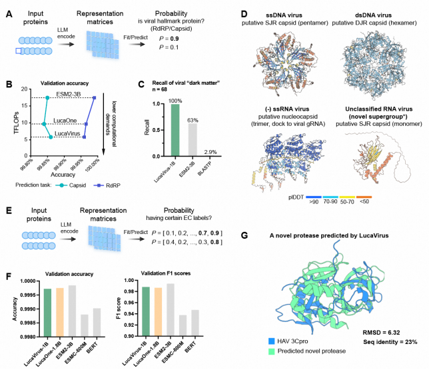

In [64]:
result.document.pictures[4].model_dump()

In [71]:



def extract_image_from_chunk(picture, filename):
    """
    Extrai a imagem base64 e textos relacionados (children, captions)
    de um objeto picture do Docling.
    """
    # Extrai URI da imagem
    if isinstance(picture.image, dict):
        image_uri =  picture.image.get("uri")
    else:
        image_uri = getattr(picture.image, "uri", None)

    uri_str = str(image_uri)
    
    if uri_str.startswith("data:") and "base64," in uri_str:
        image_uri = uri_str.split("base64,")[-1]

    # Extrai páginas
    page_numbers = sorted(
        {
            prov.page_no
            for prov in getattr(picture, "prov", [])
        }
    ) or None

    return {
        "content": image_uri,  # base64 da imagem
        "metadata": json.dumps(
            {
                "filename": filename,
                "page_numbers": page_numbers,
            }
        ),
    }

print(extract_image_from_chunk(result.document.pictures[0], os.path.dirname(FILE_PATH)))

{'content': 'iVBORw0KGgoAAAANSUhEUgAAAcMAAAB5CAIAAADKwt0uAACGFklEQVR4nOz9eZQlx3kfiH4Rud68efe1qm7tW1f1vgDdaOwkAO4kuFkiacmjZ8uy/eac8Ry9sWVLmuczo2fPvHkePZ95Mx5bpjSUKIkSxQUgSBB7gwAa6H2tqu7a97vX3fPmGvH+iKrb1VXV1dXd1UCDrN/Bady6NzIyMjPyiy++5fchSimsAqXUcRzHcdZ8v4Md7GAHO0AI8TzPcdza7xsSk1JqmqZlWQghjuMQQh/6IHewgx3s4IEGIcRxHISQIAiCIDTk5LIkdRynXq9jjCVJWi9ud7CDHexgBwxs467rOkLI5XJhjIFJUsdxNE2TJEkUxY96kDvYwQ528DEApVTXdcdx3G43QghTSuv1+o4Y3cEOdrCDrYMppBzH1et1AMCmaWKM14jRVCp17dq1j2iEO9jBDnbw8YAsy4QQ27axZVlrxCil9A//8A+/9KUvZbPZj2p8O9jBDnbw4AMhJIqiaZqYeepX/zY1NfXee+9Vq9Uf/OAHH9X4drCDHezgYwGe5wkhGGO8JuDpBz/4QX9//z/7Z//sxRdfZCaAHexgBzvYwYZgIpRfI0br9fpLL72UTCY1TTtz5szFixcfeeSRj2qIO9jBDnbw4AMhhNd8dfLkyYWFhT/+4z/+/d///UcfffTv/u7vPpKR7WAHO9jBxwj8mr+DweC/+3f/7nOf+xwAhEKhK1euUEp38p12sIMd7GAToHq9LsvyRz2MHexgBzv4uELTtLW7+x3sYAc72MGdYkeS7mAHO9jBvWJHku5gBzvYwb1iR5LuYAc72MG9Yq3vfj0sy3Ic50MYyq8UEEKSJG1jh6ZpEkK2scN7hyRJdx31sTPrOI4TBGFbujIMY4e4/d6xnp9kNTaTpPl8fmZmhhDC87cXuDu4IzDWg3g8nkgkGL/hXSOZTM7Pz3Mcx3Hcg/PCMOLwYDDY2dl

In [47]:
from docling.document_converter import DocumentConverter
from docling.datamodel.pipeline_options import PdfPipelineOptions, AcceleratorDevice, AcceleratorOptions
from docling.datamodel.base_models import InputFormat

pipeline_options = PdfPipelineOptions(generate_picture_images=True)
pipeline_options.enable_remote_services = True

source = "https://arxiv.org/pdf/2408.09869" # PDF path or URL
converter = DocumentConverter(
        format_options={
            InputFormat.PDF: PdfFormatOption(
                pipeline_options=pipeline_options
            )
        }
    )
result_image = converter.convert(source).document


2025-11-12 22:51:39,982 - INFO - detected formats: [<InputFormat.PDF: 'pdf'>]
2025-11-12 22:51:40,033 - INFO - Going to convert document batch...
2025-11-12 22:51:40,034 - INFO - Initializing pipeline for StandardPdfPipeline with options hash bd838212316175059449cfdcc4f3075f
2025-11-12 22:51:40,036 - INFO - Accelerator device: 'cpu'
[INFO] 2025-11-12 22:51:40,093 [RapidOCR] base.py:22: Using engine_name: onnxruntime
[INFO] 2025-11-12 22:51:40,122 [RapidOCR] download_file.py:60: File exists and is valid: /home/vini8cs/Repositores/Vir_ChatBot/.venv/lib/python3.12/site-packages/rapidocr/models/ch_PP-OCRv4_det_infer.onnx
[INFO] 2025-11-12 22:51:40,125 [RapidOCR] main.py:53: Using /home/vini8cs/Repositores/Vir_ChatBot/.venv/lib/python3.12/site-packages/rapidocr/models/ch_PP-OCRv4_det_infer.onnx
[INFO] 2025-11-12 22:51:40,301 [RapidOCR] base.py:22: Using engine_name: onnxruntime
[INFO] 2025-11-12 22:51:40,306 [RapidOCR] download_file.py:60: File exists and is valid: /home/vini8cs/Repositores

{'self_ref': '#/pictures/0', 'parent': {'cref': '#/body'}, 'children': [], 'content_layer': <ContentLayer.BODY: 'body'>, 'meta': None, 'label': <DocItemLabel.PICTURE: 'picture'>, 'prov': [{'page_no': 1, 'bbox': {'l': 256.3955078125, 't': 719.1266098022461, 'r': 355.6837158203125, 'b': 622.8682403564453, 'coord_origin': <CoordOrigin.BOTTOMLEFT: 'BOTTOMLEFT'>}, 'charspan': (0, 0)}], 'captions': [], 'references': [], 'footnotes': [], 'image': {'mimetype': 'image/png', 'dpi': 72, 'size': {'width': 100.0, 'height': 96.0}, 'uri': AnyUrl('')}, 'annotations': []}
{'self_ref': '#/pictures/1', 'parent': {'cref': '#/body'}, 'children': [{'cref': '#/texts/74'}], 'content_layer': <ContentLayer.BODY: 'body'>, 'meta': None, 'label': <DocItemLabel.PICTURE: 'picture'>, 'prov': [{'page_no': 3, 'bbox': {'l': 109.05867767333984, 't': 720.8739318847656, 'r': 502.184814453125, 'b': 581.8076171875, 'coord_origin': <CoordOrigin.BOTTOMLEFT: 'BOTTOMLEFT'>}, 'charspan': (0, 0)}], 'captions': [{'cref': '#/texts/7
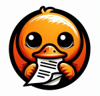
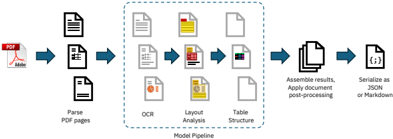
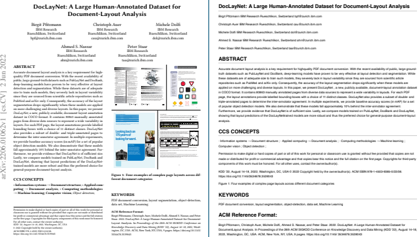
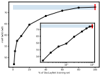
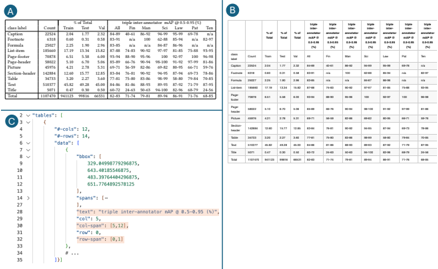

In [49]:
for picture in result_image.pictures:
    print(picture.model_dump())

In [13]:
tokenizer = TokenizerWrapper() #Load our custom tokenizer for OpenAI
MAX_TOKENS = 2048


In [ ]:
from docling.chunking import HybridChunker

chunker = HybridChunker(
    tokenizer=tokenizer,
    max_tokens=MAX_TOKENS,
    merge_peers=True,
)

chunk_iter = chunker.chunk(dl_doc=result.document)
chunks = list(chunk_iter)

len(chunks)

27

In [17]:
chunks[0].model_dump()

{'text': 'GLYPH<c=11,font=/XNFOPO+TimesNewRomanPS-ItalicMT>GLYPH<c=21,font=/XNFOPO+TimesNewRomanPS-ItalicMT>GLYPH<c=19,font=/XNFOPO+TimesNewRomanPS-ItalicMT>GLYPH<c=21,font=/XNFOPO+TimesNewRomanPS-ItalicMT>GLYPH<c=20,font=/XNFOPO+TimesNewRomanPS-ItalicMT>GLYPH<c=12,font=/XNFOPO+TimesNewRomanPS-ItalicMT>\nContents lists available at ScienceDirect',
 'meta': {'schema_name': 'docling_core.transforms.chunker.DocMeta',
  'version': '1.0.0',
  'doc_items': [{'self_ref': '#/texts/1',
    'parent': {'cref': '#/body'},
    'children': [],
    'content_layer': <ContentLayer.BODY: 'body'>,
    'meta': None,
    'label': <DocItemLabel.TEXT: 'text'>,
    'prov': [{'page_no': 1,
      'bbox': {'l': 387.883,
       't': 756.4189997695312,
       'r': 421.367,
       'b': 750.1929997695312,
       'coord_origin': <CoordOrigin.BOTTOMLEFT: 'BOTTOMLEFT'>},
      'charspan': (0, 294)}]},
   {'self_ref': '#/texts/2',
    'parent': {'cref': '#/body'},
    'children': [],
    'content_layer': <ContentLayer.B

In [ ]:
processed_chunks =deve
display(processed_chunks)    

[{'text': 'GLYPH<c=11,font=/XNFOPO+TimesNewRomanPS-ItalicMT>GLYPH<c=21,font=/XNFOPO+TimesNewRomanPS-ItalicMT>GLYPH<c=19,font=/XNFOPO+TimesNewRomanPS-ItalicMT>GLYPH<c=21,font=/XNFOPO+TimesNewRomanPS-ItalicMT>GLYPH<c=20,font=/XNFOPO+TimesNewRomanPS-ItalicMT>GLYPH<c=12,font=/XNFOPO+TimesNewRomanPS-ItalicMT>\nContents lists available at ScienceDirect',
  'metadata': {'filename': 'teste2.pdf', 'page_numbers': [1], 'title': None}},
 {'text': 'journal homepage: www.elsevier.com/locate/jcv',
  'metadata': {'filename': 'teste2.pdf',
   'page_numbers': [1],
   'title': 'Journal of Clinical Virology'}},
 {'text': 'Jutte J.C. de Vries a,* , Julianne R. Brown b , Nicole Fischer d , Igor A. Sidorov a , Sofia Morfopoulou c , Jiabin Huang d , Bas B. Oude Munnink e , Arzu Sayiner f , Alihan Bulgurcu f , Christophe Rodriguez g , Guillaume Gricourt g , Els Keyaerts h , Leen Beller h , Claudia Bachofen i , Jakub Kubacki i , Samuel Cordey j , Florian Laubscher j , Dennis Schmitz k , Martin Beer l , Dirk Ho

In [45]:
doc.texts[0]

TextItem(self_ref='#/texts/0', parent=RefItem(cref='#/body'), children=[], content_layer=<ContentLayer.FURNITURE: 'furniture'>, meta=None, label=<DocItemLabel.PAGE_HEADER: 'page_header'>, prov=[ProvenanceItem(page_no=1, bbox=BoundingBox(l=221.0, t=755.3349887695313, r=381.692, b=749.2589887695312, coord_origin=<CoordOrigin.BOTTOMLEFT: 'BOTTOMLEFT'>), charspan=(0, 176))], orig='-RXUQDO RI &OLQLFDO 9LURORJ\\ GLYPH<c=20,font=/XNFOPO+TimesNewRomanPS-ItalicMT>GLYPH<c=23,font=/XNFOPO+TimesNewRomanPS-ItalicMT>GLYPH<c=20,font=/XNFOPO+TimesNewRomanPS-ItalicMT>', text='-RXUQDO RI &OLQLFDO 9LURORJ\\ GLYPH<c=20,font=/XNFOPO+TimesNewRomanPS-ItalicMT>GLYPH<c=23,font=/XNFOPO+TimesNewRomanPS-ItalicMT>GLYPH<c=20,font=/XNFOPO+TimesNewRomanPS-ItalicMT>', formatting=None, hyperlink=None)

In [35]:
headings = [item for item in doc.texts if isinstance(item, SectionHeaderItem)]
for heading in headings:
    print(f"Heading (level {heading.level}): {heading.text}")


Heading (level 1): Journal of  Clinical  Virology
Heading (level 1): Benchmark  of  thirteen  bioinformatic  pipelines  for  metagenomic  virus diagnostics  using datasets  from clinical samples
Heading (level 1): ARTICLE INFO
Heading (level 1): https://doi.org/10.1016/j.jcv.2021.104908
Heading (level 1): ABSTRACT
Heading (level 1): 1.Introduction
Heading (level 1): [ 26 , 27], DIAMOND [28],  DNASTAR  [29],  FEVIR
Heading (level 1): trimmed metagenomic  datasets  were  provided,
Heading (level 1): In  total 13  different metagenomic
Heading (level 1): Cq value
Heading (level 1): 3.3. Taxonomic level  of classification
Heading (level 1): AL.
Heading (level 1): ability  of  the Data  Hubs.


In [36]:
for table in doc.tables:
    print("Table:")
    print(table.export_to_markdown(doc=doc)) 

Table:
Table 1 Clinical use, classification and output  characteristics  of  metagenomic  pipelines analysed.

| Pipeline no (alphabetical order)                          | 1 2                                         | 3                                                      | and 3A 4                                                     | 5                                             | 6                                        | 7                                                                | 8ac                                    | 9                                                   | 10                                                         | 11                                                         | 12                               | 13                             |                                                                      |
|-----------------------------------------------------------|---------------------------------------------|----------------------------------------

Figures:

Figures:

Figures:
Image
Figures:
Fig. 1. Workflow of bioinformatic analysis of (viral) metagenomics data with the pipelines and classification tools used by participants in the current study.


Figures:

Figures:

Figures:
Fig. 3. (Taxonomic) level of classification and typing of the pathogenic viruses identified using the combination of tools and databases, as reported by participating diagnostic laboratories. Depicted are the number of target viruses per classification level.RefSeq; NCBI ' s  RefSeq data base (or an adapted version), NT; NCBI ' s nucleotide database (or an adapted version); LCA; lowest common ancestor. *Taxonomic assignment method described in [25,26]


Figures:
Fig. 4. Sensitivity and positive predictive value based on the hits reported by the participants, for the different pipelines/classification tools.



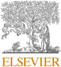
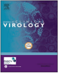
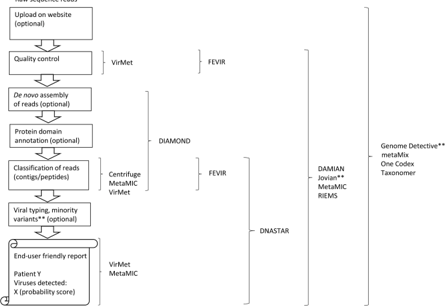
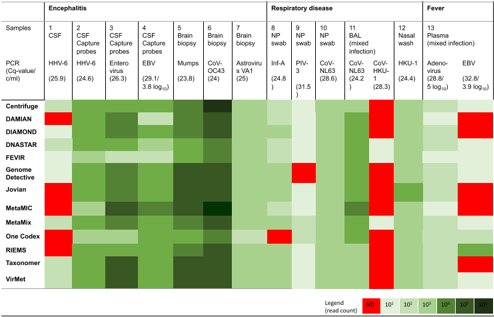
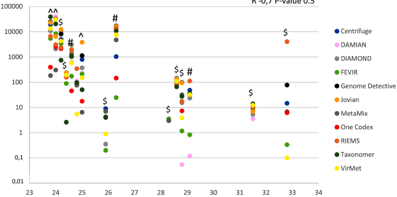
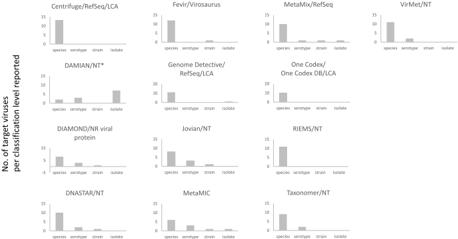
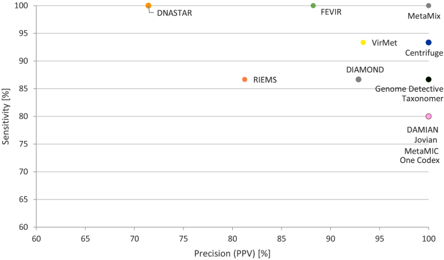

In [9]:
for figure in doc.pictures:
    print("Figures:")
    print(figure.export_to_markdown(doc=doc))

In [3]:
from langchain_text_splitters import RecursiveCharacterTextSplitter

loader = DoclingPDFLoader(file_path =FILE_PATH)
text_splitter = RecursiveCharacterTextSplitter(
    chunk_size = 4000,
    chunk_overlap = 0
)

In [4]:
docs = loader.load()
splits = text_splitter.split_documents(docs)

2025-11-10 19:26:11,244 - INFO - detected formats: [<InputFormat.PDF: 'pdf'>]
2025-11-10 19:26:11,313 - INFO - Going to convert document batch...
2025-11-10 19:26:11,315 - INFO - Initializing pipeline for StandardPdfPipeline with options hash f9730ffaa6e7f8d4fb0c98c8df3f18cb
2025-11-10 19:26:11,527 - INFO - Loading plugin 'docling_defaults'
2025-11-10 19:26:11,530 - WARNING - The plugin langchain_docling will not be loaded because Docling is being executed with allow_external_plugins=false.
2025-11-10 19:26:11,531 - INFO - Registered picture descriptions: ['vlm', 'api']
2025-11-10 19:26:11,548 - INFO - Loading plugin 'docling_defaults'
2025-11-10 19:26:11,554 - WARNING - The plugin langchain_docling will not be loaded because Docling is being executed with allow_external_plugins=false.
2025-11-10 19:26:11,555 - INFO - Registered ocr engines: ['auto', 'easyocr', 'ocrmac', 'rapidocr', 'tesserocr', 'tesseract']
2025-11-10 19:26:11,956 - INFO - Accelerator device: 'cpu'
[INFO] 2025-11-10 1

In [8]:
splits[3].page_content

"136\n\n137\n\n138\n\n139\n\n140\n\n141\n\n142\n\n143\n\n144\n\n145\n\n146\n\n147\n\n148\n\n149\n\n150\n\n151\n\n152\n\n153\n\n154\n\n155\n\n156\n\n157\n\n158\n\n159\n\n160\n\n161\n\nat decoding the functional landscape of viral genomes (see Methods).\n\n## LucaVirus learns interpretable representations of viral sequences\n\nAs  an  encoder  model,  LucaVirus  extracts  biologically  meaningful  features  from  viral sequences and embeds them into a high-dimensional space. To demonstrate the interpretability of LucaVirus embeddings, we correlated the model's outputs with biologically relevant and human-interpretable sequence features.\n\nOur  results  suggest  that  LucaVirus  nucleotide  embeddings  capture  key  aspects  of  the relationship between nucleotide and amino acid sequences. As shown by principal components analysis  (PCA),  LucaVirus  embeddings  reflect  multiple  layers  of  genomic  organization, including differentiation between coding and non-coding regions, codon ph

In [11]:
splits[7].metadata

{}

# Chat

In [1]:
from chat import Chat
from langchain_google_genai import GoogleGenerativeAIEmbeddings

chat = Chat(vectorstore_path="/mnt/vini/VirBotAI/vectorstore", sqlite_memory_database = "/mnt/vini/VirBotAI/memory.sqlite")
await chat.run_chat()

2025-11-22 18:42:13,234 - INFO - Initializing Gemini client...
2025-11-22 18:42:16,450 - INFO - Loading faiss with AVX2 support.
2025-11-22 18:42:16,509 - INFO - Successfully loaded faiss with AVX2 support.


Starting chat test...
================================ Human Message =================================

what are one of the smallest virus dicovered yet?
Messages to model: [HumanMessage(content='How many viruses fit into a needle head?', additional_kwargs={}, response_metadata={}, id='d07f11e6-ba4c-441f-86f7-3009f6bd7ac0'), AIMessage(content='', additional_kwargs={'function_call': {'name': 'retrieve', 'arguments': '{"query": "size of viruses"}'}}, response_metadata={'prompt_feedback': {'block_reason': 0, 'safety_ratings': []}, 'finish_reason': 'STOP', 'model_name': 'gemini-2.5-flash', 'safety_ratings': []}, id='run--dcb8a159-b93e-45b2-8250-4a4fc3645d60-0', tool_calls=[{'name': 'retrieve', 'args': {'query': 'size of viruses'}, 'id': 'e9353694-3d4c-4c3b-b277-b0e4b9bbe992', 'type': 'tool_call'}], usage_metadata={'input_tokens': 164, 'output_tokens': 76, 'total_tokens': 240, 'input_token_details': {'cache_read': 0}, 'output_token_details': {'reasoning': 61}}), ToolMessage(content='[\n    

In [31]:
import config as _
import sqlite3
import os

def search_threads(user_id: str, sqlite_db_path: str):
    """
    Search for threads belonging to a user based on user_id stored in metadata.
    """
    if not os.path.isabs(sqlite_db_path):
        sqlite_db_path = os.path.join(os.getcwd(), sqlite_db_path)

    if not os.path.exists(sqlite_db_path):
        return []

    try:
        with sqlite3.connect(sqlite_db_path) as conn:
            cur = conn.cursor()
            # metadata is stored as BLOB, so cast it to TEXT before using json_extract
            query = """
            SELECT DISTINCT thread_id 
            FROM checkpoints 
            WHERE json_extract(CAST(metadata AS TEXT), '$.user_id') = ?
            """

            cur.execute(query, (str(user_id),))
            rows = cur.fetchall()

            return [{"thread_id": r[0]} for r in rows]

    except sqlite3.Error as e:
        print(f"Database error: {e}")
        return []


search_threads("default_user", "/mnt/vini/VirBotAI/sqlite_db/memory.sqlite")

[{'thread_id': '1'},
 {'thread_id': '2'},
 {'thread_id': '3'},
 {'thread_id': '4'}]

In [ ]:
import streamlit as st
import requests
import config as _
from streamlit_ui.api import get_user_threads


def start_session_data(user_id: str):
    if "user_id" not in st.session_state:
        st.session_state.user_id = user_id

    if "threads_id" not in st.session_state:
        st.session_state.threads_id = []
        threads = get_user_threads(st.session_state.user_id)
        for thread in threads:
            st.session_state.threads_id.append(thread["thread_id"])

    if "selected_thread" not in st.session_state:
        if st.session_state.threads_id:
            st.session_state.selected_thread = st.session_state.threads_id[-1]
        else:
            st.session_state.selected_thread = None

    if "thread_state" not in st.session_state:
        st.session_state.thread_state = {}


def create_thread_api(user_id: str) -> dict:
    response = requests.post(
        f"{_.API_BASE_URL}/threads/create", json={"user_id": user_id}
    )
    response.raise_for_status()
    return response.json()


def create_new_thread(user_id: str):
    thread = create_thread_api(user_id)
    st.session_state.threads_id.append(thread["thread_id"])
    st.session_state.selected_thread = thread["thread_id"]
    st.session_state.thread_state = {}
    st.rerun()


In [10]:
start_session_data("default_user1")
create_new_thread("default_user1")

2025-12-06 22:53:20.821 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-12-06 22:53:20.824 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-12-06 22:53:20.825 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-12-06 22:53:20.827 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-12-06 22:53:20.833 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-12-06 22:53:20.834 WARNING streamlit.run